# Prepare Student Staff Data for Upload

Notebook reads in person record data linked to schools and jobs. Splits the data for students and school staff for Lumberton NC schools.

## Description of Program
- program:    ICD_1dv1_PrepStudentStaff
- task:       Setup data for students and staff
- See github commits for description of program updates
- Current Version:    2022-01-12
- project:    Interdependent Networked Community Resilience Modeling Environment (IN-CORE)'}, Subtask 5.2 - Social Institutions
- funding:	  NIST Financial Assistance Award Numbers: 70NANB15H044 and 70NANB20H008 
- author:     Nathanael Rosenheim

- Suggested Citation:
Rosenheim, N. (2022)'}, 

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import os # For saving output to path

In [2]:
# Display versions being used - important information for replication
import sys
print("Python Version     ", sys.version)
print("numpy version:     ", np.__version__)
print("pandas version:    ", pd.__version__)

Python Version      3.8.12 | packaged by conda-forge | (default, Oct 12 2021, 21:22:46) [MSC v.1916 64 bit (AMD64)]
numpy version:      1.22.2
pandas version:     1.4.0


In [3]:
# Store Program Name for output files to have the same name
programname = "ICD_1dv1_PrepStudentStaff"
# Save Outputfolder - due to long folder name paths output saved to folder with shorter name
# files from this program will be saved with the program name - this helps to follow the overall workflow
outputfolder = "ICD_workflow_2022-01-19"
# Make directory to save output
if not os.path.exists(outputfolder):
    os.mkdir(outputfolder)

In [4]:
os.getcwd()

'g:\\Shared drives\\HRRC_IN-CORE\\Tasks\\M5.2-01 Pop inventory\\WorkNPR'

### Setup notebook enviroment to access Cloned Github Package
This notebook uses packages that are in developement. The packages are available at:

https://github.com/npr99/Labor_Market_Allocation

To replicate this notebook Clone the Github Package to a folder that is a sibling of this notebook.

To access the sibling package you will need to append the parent directory ('..')'}, to the system path list.

In [5]:
# to access new package that is in a sibling folder - the system path list needs to include the parent folder (..)'},
# append the path of the directory that includes the github repository.
sys.path.append("..\\github_com\\npr99\\Population_Inventory")

# Setup access to IN-CORE
https://incore.ncsa.illinois.edu/

In [6]:
#from pyincore import IncoreClient, Dataset, FragilityService, MappingSet, DataService
#from pyincore_viz.geoutil import GeoUtil as viz

### IN-CORE addons
This program uses coded that is being developed as potential add ons to pyincore. These functions are in a folder called pyincore_addons - this folder is located in the same directory as this notebook.
The add on functions are organized to mirror the folder sturcture of https://github.com/IN-CORE/pyincore

Each add on function attempts to follow the structure of existing pyincore functions and includes some help information.

In [7]:
# To reload submodules need to use this magic command to set autoreload on
%load_ext autoreload
%autoreload 2
# open, read, and execute python program with reusable commands
from pyincore_data_addons.ICD00b_directory_design import directory_design

## Read In Census data for a County

In [8]:
#state_counties = {'48167' : 'Galveston County, TX'}
#state_counties = {'37155' : 'Robeson County, NC'}
#state_counties = {'26127' : 'Oceanna County, MI'}
#state_counties = {'48041' : 'Brazos County, TX'}
communities = {'Lumberton_NC' : {
                    'community_name' : 'Lumberton, NC',
                    'counties' : { 
                        1 : {'FIPS Code' : '37155', 'Name' : 'Robeson County, NC'}}},                   
                }

seed = 9876
basevintage = '2010'
version = '0.2.0'
version_text = 'v0-2-0'

In [9]:
for community in communities.keys():
    print("Setting up Housing Unit and Person Record Inventories for",communities[community]['community_name'])
    for county in communities[community]['counties'].keys():
        state_county = communities[community]['counties'][county]['FIPS Code']
        state_county_name  = communities[community]['counties'][county]['Name']
        print(state_county_name,': county FIPS Code',state_county)
    
        outputfolders = directory_design(state_county_name = state_county_name,
                                            outputfolder = outputfolder)
                                            
    #Save results for community name
    output_filename = f'prec_{version_text}_{community}_{basevintage}_rs{seed}'
    output_filepath = os.path.join(outputfolders['top'], output_filename+'.csv')
    icd_df = pd.read_csv(output_filepath,low_memory=False)

Setting up Housing Unit and Person Record Inventories for Lumberton, NC
Robeson County, NC : county FIPS Code 37155


## Split Data for Students

In [10]:
icd_df[['huid']].describe()

,huid
count,134168
unique,48037
top,B371559605021019H001
freq,1150


In [11]:
huid = 'B371559602022021H018'
icd_df[['huid','pernum','race','hispan']].loc[icd_df['huid']==huid].sort_values(by='pernum')

,huid,pernum,race,hispan
45644,B371559602022021H018,1.0,3.0,0.0
45645,B371559602022021H018,2.0,3.0,0.0
45646,B371559602022021H018,3.0,3.0,0.0
45647,B371559602022021H018,4.0,3.0,0.0
45648,B371559602022021H018,5.0,7.0,0.0


In [12]:
icd_df.head(1).T

,0
precid,B371559602012079P0063
huid,B371559602012079H033
pernum,5.0
Block2010str,B371559602012079
PLCGEOID10,NaN
PLCNAME10,Unincorporated
CommunityFocus,Outside Community
PUMGEOID10,3705100.0
rppnt4269,POINT (-79.07091010522959 34.8609445)
sex,2


In [13]:
id_cols = ['precid','huid','Block2010str']
prec_char_cols = ['sex','race','hispan','randagePCT12','gqtype']
home_geo_cols = ['hcb_lat','hcb_lon']
student_char_cols = ['gradelevel']
school_geo_cols = ['ncs_lat','ncs_lon','SCHNAM09','NCESSCH','hcb_ncs_line']

staff_char_cols = ['Earnings','agegroupLODES','Education','jobtype','IndustryCode','NAICS2D']
work_geo_cols = ['wet_lat','wet_lon','hcb_wet_line','SIName','od_distance']

In [14]:
student_cols = id_cols + prec_char_cols + home_geo_cols + \
    student_char_cols + school_geo_cols

staff_cols = id_cols + prec_char_cols + home_geo_cols + \
    staff_char_cols + work_geo_cols

In [15]:
student_df = icd_df[student_cols].copy()
staff_df = icd_df[staff_cols].copy()

In [16]:
student_df.head(1).T

,0
precid,B371559602012079P0063
huid,B371559602012079H033
Block2010str,B371559602012079
sex,2
race,3.0
hispan,0.0
randagePCT12,18.0
gqtype,0.0
hcb_lat,34.860941
hcb_lon,-79.070909


In [17]:
staff_df.head(1).T

,0
precid,B371559602012079P0063
huid,B371559602012079H033
Block2010str,B371559602012079
sex,2
race,3.0
hispan,0.0
randagePCT12,18.0
gqtype,0.0
hcb_lat,34.860941
hcb_lon,-79.070909


## Select Schools to focus on 
Only keep students and staff related to schools in Lumberton study area


In [18]:
icd_df['CommunityFocus'].describe()

count                134168
unique                    2
top       Outside Community
freq                 111807
Name: CommunityFocus, dtype: object

In [19]:
school_focus = icd_df.loc[icd_df['CommunityFocus'] == 'Inside Community'].SCHNAM09.unique().tolist()
# Drop nan values
school_focus = [x for x in school_focus if pd.isnull(x) == False]

In [20]:
school_focus.sort()
school_focus

['JANIE C HARGRAVE ELEM',
 'L GILBERT CARROLL MIDDLE',
 'LUMBERTON JUNIOR HIGH',
 'LUMBERTON SENIOR HIGH',
 'ROWLAND NORMENT ELEMENTARY',
 'TANGLEWOOD ELEMENTARY',
 'W H KNUCKLES',
 'WEST LUMBERTON ELEMENTARY']

## Keep Students in Selected Schools

In [21]:
select_student_df = student_df.loc[student_df['SCHNAM09'].isin(school_focus)].copy()

In [22]:
select_student_df.head()

,precid,huid,Block2010str,sex,race,hispan,randagePCT12,gqtype,hcb_lat,hcb_lon,gradelevel,ncs_lat,ncs_lon,SCHNAM09,NCESSCH,hcb_ncs_line
9,B371559607013047P0021,B371559607013047H013,B371559607013047,2,3.0,1.0,18.0,0.0,34.673495,-79.026760,G12,34.645515,-79.000066,LUMBERTON SENIOR HIGH,3.703930e+11,LINESTRING ( -79.02676017837098 34.67349471682...
10,B371559612002011P0022,B371559612002011H010,B371559612002011,2,1.0,0.0,18.0,0.0,34.621088,-78.998386,G12,34.645515,-79.000066,LUMBERTON SENIOR HIGH,3.703930e+11,LINESTRING ( -78.99838605955388 34.62108796584...
11,B371559613011015P0005,B371559613011015H001,B371559613011015,1,3.0,0.0,18.0,0.0,34.707093,-78.991152,G12,34.645515,-79.000066,LUMBERTON SENIOR HIGH,3.703930e+11,LINESTRING ( -78.99115209836263 34.70709260906...
12,B371559615001004P0086,B371559615001004H062,B371559615001004,2,1.0,0.0,18.0,0.0,34.603250,-78.857099,G12,34.645515,-79.000066,LUMBERTON SENIOR HIGH,3.703930e+11,LINESTRING ( -78.85709918161747 34.60324987369...
17064,B371559606002040P0028,B371559606002040H021,B371559606002040,2,2.0,0.0,16.0,0.0,34.649000,-79.074448,G10,34.645515,-79.000066,LUMBERTON SENIOR HIGH,3.703930e+11,LINESTRING ( -79.0744479260538 34.648999797246...


## Keep Staff for selected schools

In [23]:
school_focus2 = icd_df.loc[icd_df['CommunityFocus'] == 'Inside Community'].SIName.unique().tolist()
# Drop nan values
school_focus2 = [x for x in school_focus2 if pd.isnull(x) == False]
school_focus2.sort()
school_focus2


['ANTIOCH CHRISTIAN ACADEMY',
 'CIS ACADEMY',
 'COMMUNITIES IN SCHOOL ACADEMY',
 'CONTINUING EDUCATION EXTENSION',
 'DEEP BRANCH ELEMENTARY SCHOOL',
 'DUKE UNIVERSITY PDC',
 'EAST ROBESON ELEMENTARY SCHOOL',
 'FAIRGROVE MIDDLE SCHOOL',
 'FAIRMONT HIGH SCHOOL',
 'FAIRMONT MIDDLE SCHOOL',
 'FLORA MAC DONALD ACADEMY',
 'GILBERT CARROLL MIDDLE SCHOOL',
 'GREEN GROVE ELEMENTARY SCHOOL',
 'INDIAN EDUCATION RESOURCE CTR',
 'JANIE CARYLE HARGRAVE SCHOOL',
 'LITTLEFIELD MIDDLE SCHOOL',
 'LONG BRANCH ELEMENTARY SCHOOL',
 'LUMBERTON JUNIOR HIGH SCHOOL',
 'LUMBERTON SENIOR HIGH SCHOOL',
 'LUMBERTON TRUCK DRIVING ACAD',
 'MAGNOLIA SCHOOL',
 'MT ZION CHRISTIAN ACADEMY',
 'N C SCHOOL LINK',
 'NORTH CAROLINA DEPT MENTAL',
 'OMEGA CHRISTIAN ACADEMY',
 'ORRUM MIDDLE SCHOOL',
 'OXENDINE ELEMENTARY SCHOOL',
 'PARKTON ELEMENTARY SCHOOL',
 'PEMBROKE ELEMENTARY SCHOOL',
 'PEMBROKE MIDDLE SCHOOL',
 'PETERSON ELEMENTARY SCHOOL',
 'PINEY GROVE ELEMENTARY SCHOOL',
 'PRECIOUS KIDS LEARNING CTR',
 'PROSPECT ELEMEN

### Hand select schools to focus on for staff
Staff locations include schools and administrative locations.

In [24]:
selected_staff_schools = ['TANGLEWOOD ELEMENTARY SCHOOL',
 'PUBLIC SCHOOLS OF REBESON CNTY',
 'LUMBERTON SENIOR HIGH SCHOOL',
 'LUMBERTON JUNIOR HIGH SCHOOL',
 'W H KNUCKLES ELEMENTARY SCHOOL',
 'GILBERT CARROLL MIDDLE SCHOOL',
 'WEST LUMBERTON ELEMENTARY SCHL',
 'ROWLAND NORMENT SCHOOL',
 'JANIE CARYLE HARGRAVE SCHOOL']

In [25]:
selected_staff_schools.sort()
selected_staff_schools

['GILBERT CARROLL MIDDLE SCHOOL',
 'JANIE CARYLE HARGRAVE SCHOOL',
 'LUMBERTON JUNIOR HIGH SCHOOL',
 'LUMBERTON SENIOR HIGH SCHOOL',
 'PUBLIC SCHOOLS OF REBESON CNTY',
 'ROWLAND NORMENT SCHOOL',
 'TANGLEWOOD ELEMENTARY SCHOOL',
 'W H KNUCKLES ELEMENTARY SCHOOL',
 'WEST LUMBERTON ELEMENTARY SCHL']

In [26]:
school_focus

['JANIE C HARGRAVE ELEM',
 'L GILBERT CARROLL MIDDLE',
 'LUMBERTON JUNIOR HIGH',
 'LUMBERTON SENIOR HIGH',
 'ROWLAND NORMENT ELEMENTARY',
 'TANGLEWOOD ELEMENTARY',
 'W H KNUCKLES',
 'WEST LUMBERTON ELEMENTARY']

In [27]:
select_staff_df = staff_df.loc[staff_df['SIName'].isin(selected_staff_schools)].copy()
select_staff_df.head()

,precid,huid,Block2010str,sex,race,hispan,randagePCT12,gqtype,hcb_lat,hcb_lon,...,agegroupLODES,Education,jobtype,IndustryCode,NAICS2D,wet_lat,wet_lon,hcb_wet_line,SIName,od_distance
1,B371559602021039P0017,B371559602021039H010,B371559602021039,2,3.0,0.0,18.0,0.0,34.844962,-79.102068,...,1.0,0.0,JT07,15.0,61.0,34.623703,-79.053109,LINESTRING ( -79.10206758419059 34.84496163245...,PUBLIC SCHOOLS OF REBESON CNTY,25.645043
2,B371559602021053P0054,B371559602021053H047,B371559602021053,1,3.0,0.0,18.0,0.0,34.839758,-79.094627,...,1.0,0.0,JT07,15.0,61.0,34.623703,-79.053109,LINESTRING ( -79.09462736604465 34.83975812122...,PUBLIC SCHOOLS OF REBESON CNTY,25.961887
7,B371559606001042P0015,B371559606001042H013,B371559606001042,2,3.0,0.0,18.0,0.0,34.676652,-79.146020,...,1.0,0.0,JT07,15.0,61.0,34.623703,-79.053109,LINESTRING ( -79.1460200450295 34.676651650758...,PUBLIC SCHOOLS OF REBESON CNTY,18.744671
12,B371559615001004P0086,B371559615001004H062,B371559615001004,2,1.0,0.0,18.0,0.0,34.603250,-78.857099,...,1.0,0.0,JT07,15.0,61.0,34.623703,-79.053109,LINESTRING ( -78.85709918161747 34.60324987369...,PUBLIC SCHOOLS OF REBESON CNTY,8.818913
14,B371559618011065P0023,B371559618011065H013,B371559618011065,2,3.0,0.0,18.0,0.0,34.654798,-79.208350,...,1.0,0.0,JT07,15.0,61.0,34.623703,-79.053109,LINESTRING ( -79.2083499517729 34.654798203197...,PUBLIC SCHOOLS OF REBESON CNTY,3.357464


In [28]:
select_staff_df.precid.describe()

count                      1873
unique                     1873
top       B371559602021039P0017
freq                          1
Name: precid, dtype: object

In [29]:
select_staff_df.od_distance.describe()

count    1873.000000
mean       44.595908
std       124.476673
min         0.194811
25%         9.504479
50%        19.018829
75%        34.457632
max      3009.571667
Name: od_distance, dtype: float64

### Clean Files Data Types

In [30]:
def save_student_staff_v020(input_df, data_structure, filestem):
    """
    IN-CORE expects specific columns
    Alpha release of housing unit inventories had 
    columns in specific order
    """

    output_df = input_df.copy()
    # create list of all required ergo:buildingInventoryVer6 columns
    incore_columns = data_structure
    
    current_column_names = list(output_df.columns)
    output_col_order = []
    # Loop through required column names
    for incore_col in incore_columns.keys():
        print('Checking output for',incore_col)
        output_col_order.append(incore_col)
        # Check if required column is in current column names
        if incore_col not in current_column_names:
            print("Current version is missing",incore_col)
    # Loop through columns to set type
    for incore_col in incore_columns.keys():    
        # Set variable type
        var_type = incore_columns[incore_col]['pyType']
        print('Checking',incore_col,'Data Type')
        current_type = type(output_df[incore_col])
        print('   Current type:',current_type,'Expected type',var_type)
        output_df[incore_col] = output_df[incore_col].astype(var_type)

    output_df = output_df[output_col_order]
    # Save output description as text
    output_filename = f'{filestem}_{state_county}_{basevintage}_rs{seed}'
    print("\n***************************************")
    print(f"    Save IN-CORE {filestem} data file.")
    print("***************************************\n")

    csv_filepath = outputfolders['top']+"/"+output_filename+'.csv'
    savefile = sys.path[0]+"/"+csv_filepath
    output_df.to_csv(savefile, index=False)
    print("File saved:",savefile)       
    return output_df    


In [31]:
from pyincore_data_addons.ICD00a_datastructure \
    import prec_v020_DataStructure, student_v020_DataStructure
datastructure = {**prec_v020_DataStructure, 
                         **student_v020_DataStructure}

incore_student_df = save_student_staff_v020(select_student_df, 
                                            datastructure, 
                                            'student_v020')

Checking output for precid
Checking output for huid
Checking output for Block2010str
Checking output for hcb_lat
Checking output for hcb_lon
Checking output for sex
Checking output for race
Checking output for hispan
Checking output for randagePCT12
Checking output for gqtype
Checking output for gradelevel
Checking output for SCHNAM09
Checking output for NCESSCH
Checking output for ncs_lat
Checking output for ncs_lon
Checking output for hcb_ncs_line
Checking precid Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking huid Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking Block2010str Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking hcb_lat Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'float'>
Checking hcb_lon Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'float'>
C

In [32]:
select_staff_df.randagePCT12.describe()

count    1379.000000
mean       44.978970
std        12.136093
min        18.000000
25%        36.000000
50%        46.000000
75%        55.000000
max        65.000000
Name: randagePCT12, dtype: float64

In [33]:
from pyincore_data_addons.ICD00a_datastructure \
    import prec_v020_DataStructure, staff_v020_DataStructure
datastructure = {**prec_v020_DataStructure, 
                         **staff_v020_DataStructure}

# replace 'nan' values with missing
select_staff_df['huid'] = select_staff_df['huid'].replace('nan',np.nan)

incore_staff_df = save_student_staff_v020(select_staff_df, 
                                            datastructure, 
                                            'staff_v020')

Checking output for precid
Checking output for huid
Checking output for Block2010str
Checking output for hcb_lat
Checking output for hcb_lon
Checking output for sex
Checking output for race
Checking output for hispan
Checking output for randagePCT12
Checking output for gqtype
Checking output for Earnings
Checking output for agegroupLODES
Checking output for Education
Checking output for jobtype
Checking output for IndustryCode
Checking output for NAICS2D
Checking output for SIName
Checking output for wet_lat
Checking output for wet_lon
Checking output for od_distance
Checking output for hcb_wet_line
Checking precid Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking huid Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking Block2010str Data Type
   Current type: <class 'pandas.core.series.Series'> Expected type <class 'str'>
Checking hcb_lat Data Type
   Current type: <class 'pandas.core.seri

## Save files for sharing

In [34]:
output_filepath = os.path.join(outputfolders['top'], output_filename+'_students.csv')
select_student_df.to_csv(output_filepath,index=False)

In [35]:
output_filepath = os.path.join(outputfolders['top'], output_filename+'_schoolstaff.csv')
select_staff_df.to_csv(output_filepath,index=False)

## Explore Data

In [36]:
from pyincore_data_addons.ICD04c_linestring_map import map_by_linestrings

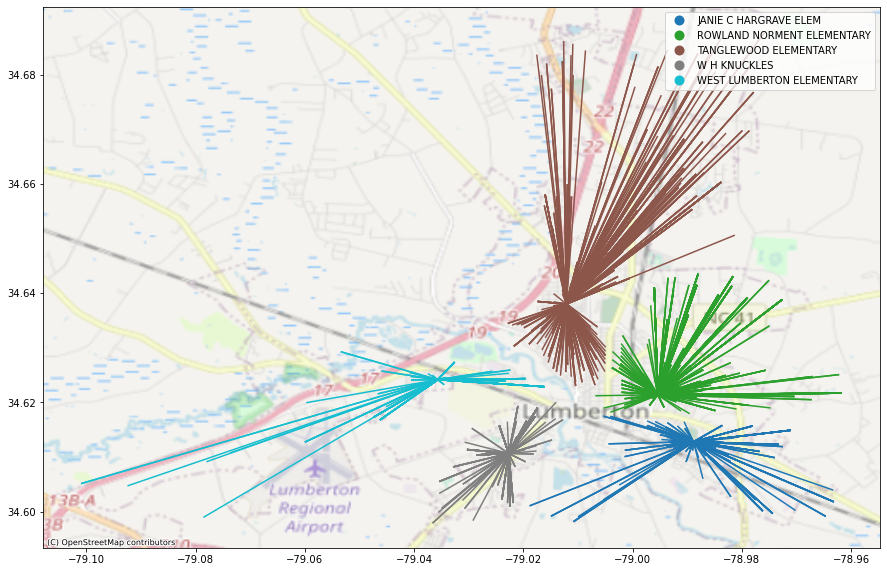

In [37]:
# select grade levels
gradelevels = ['PK','KG','G01','G02','G03','G04']
school_staff_map = map_by_linestrings(select_student_df,
                linestring_var = 'hcb_ncs_line', legend_column = 'SCHNAM09', 
                select_column = 'gradelevel',
                obs_select = gradelevels)
# save figure
output_filepath = os.path.join(outputfolders['Explore'], output_filename+"_PKG04.png")
school_staff_map.savefig(output_filepath)

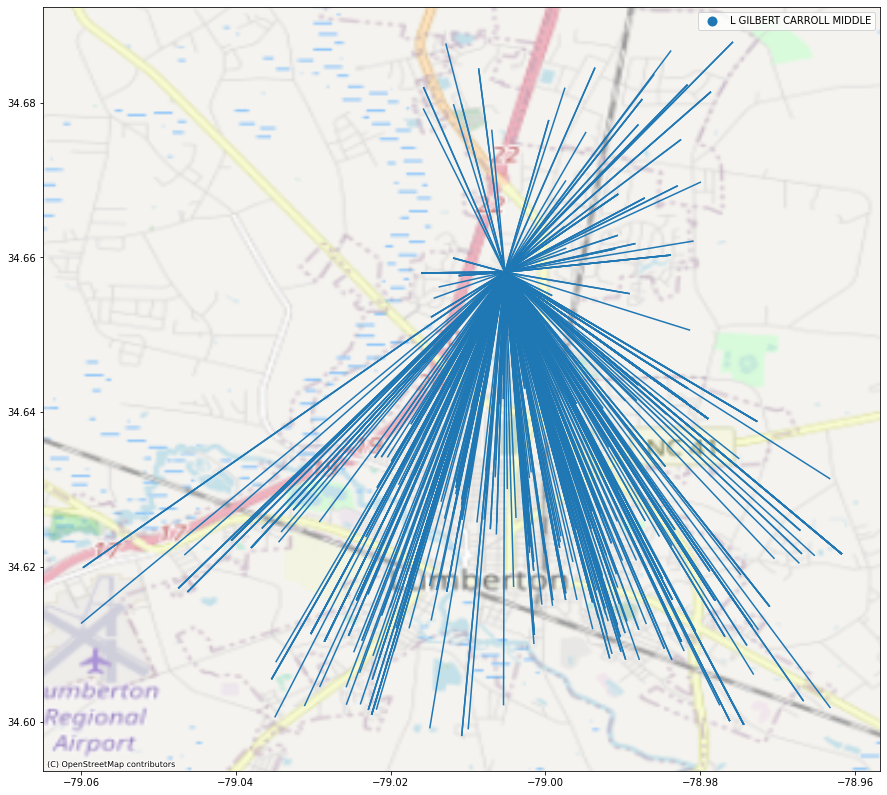

In [38]:
# select grade levels
gradelevels = ['G05','G06']
school_staff_map = map_by_linestrings(select_student_df,
                linestring_var = 'hcb_ncs_line', legend_column = 'SCHNAM09', 
                select_column = 'gradelevel',
                obs_select = gradelevels)
# save figure
output_filepath = os.path.join(outputfolders['Explore'], output_filename+"_G05G06.png")
school_staff_map.savefig(output_filepath)

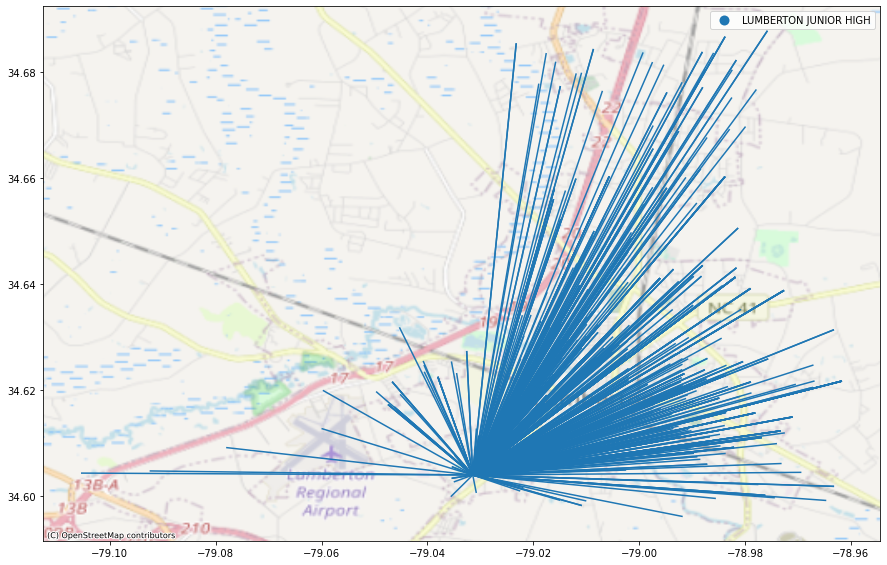

In [39]:
# select grade levels
gradelevels = ['G07','G08']
school_staff_map = map_by_linestrings(select_student_df,
                linestring_var = 'hcb_ncs_line', legend_column = 'SCHNAM09', 
                select_column = 'gradelevel',
                obs_select = gradelevels)
# save figure
output_filepath = os.path.join(outputfolders['Explore'], output_filename+"_G07G08.png")
school_staff_map.savefig(output_filepath)

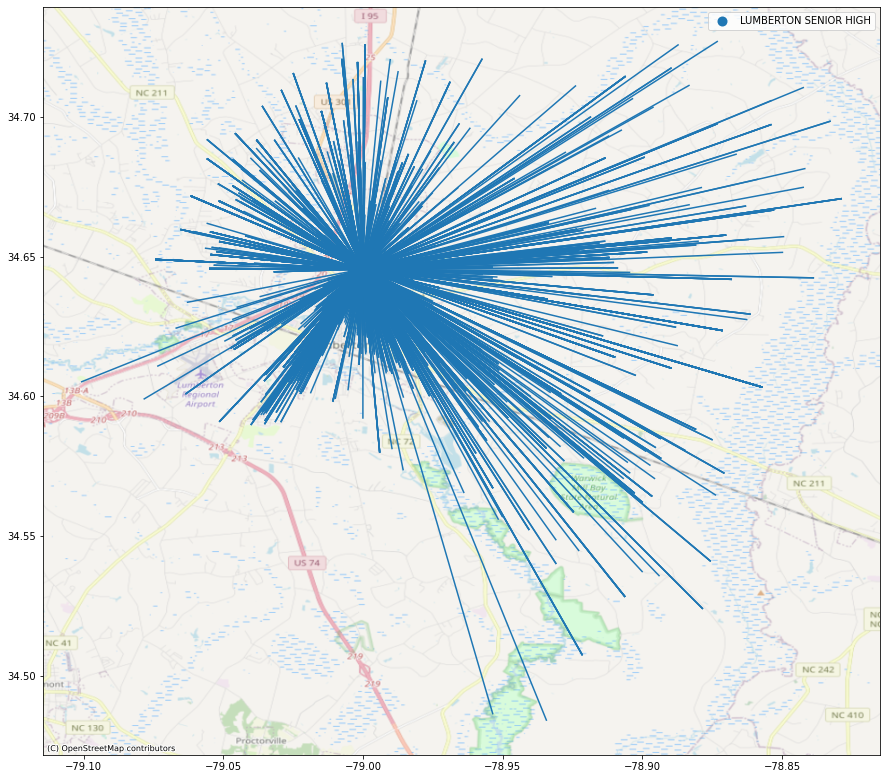

In [40]:
# select grade levels
gradelevels = ['G09','G10','G11','G12']
school_staff_map = map_by_linestrings(select_student_df,
                linestring_var = 'hcb_ncs_line', legend_column = 'SCHNAM09', 
                select_column = 'gradelevel',
                obs_select = gradelevels)
# save figure
output_filepath = os.path.join(outputfolders['Explore'], output_filename+"_G09G12.png")
school_staff_map.savefig(output_filepath)

## Explore Staff Data

In [41]:
distance_80p = select_staff_df['od_distance'].quantile(0.80)

GILBERT CARROLL MIDDLE SCHOOL
JANIE CARYLE HARGRAVE SCHOOL
LUMBERTON JUNIOR HIGH SCHOOL
LUMBERTON SENIOR HIGH SCHOOL
PUBLIC SCHOOLS OF REBESON CNTY
ROWLAND NORMENT SCHOOL
TANGLEWOOD ELEMENTARY SCHOOL
W H KNUCKLES ELEMENTARY SCHOOL
WEST LUMBERTON ELEMENTARY SCHL


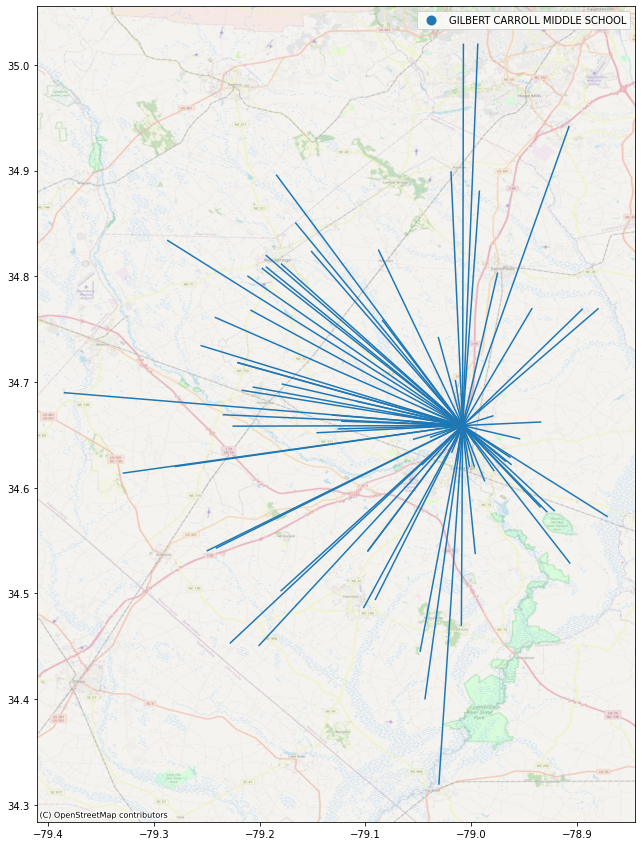

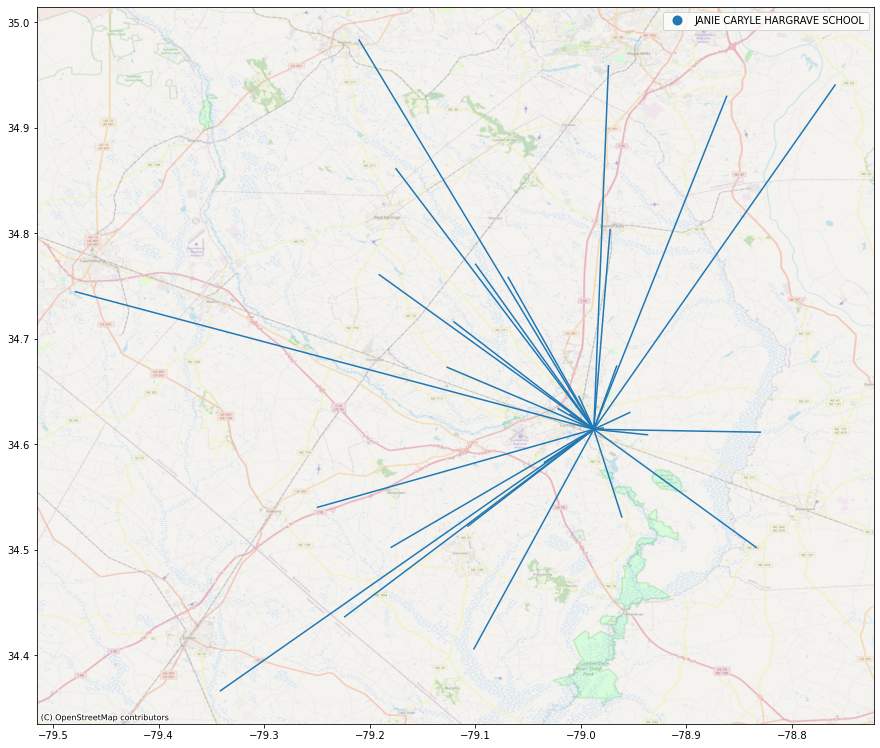

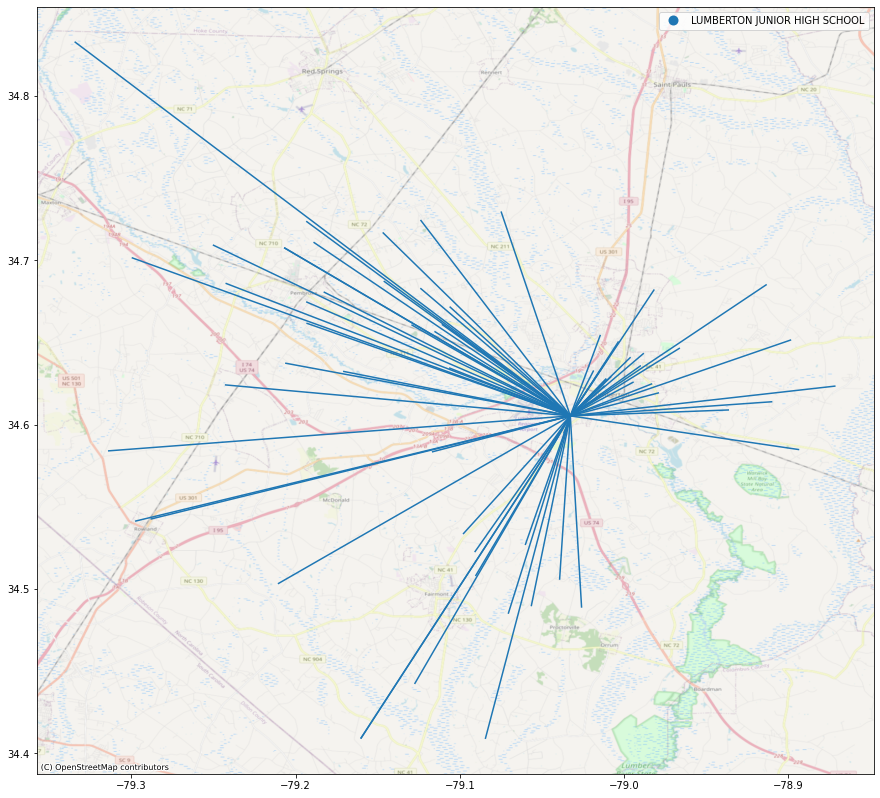

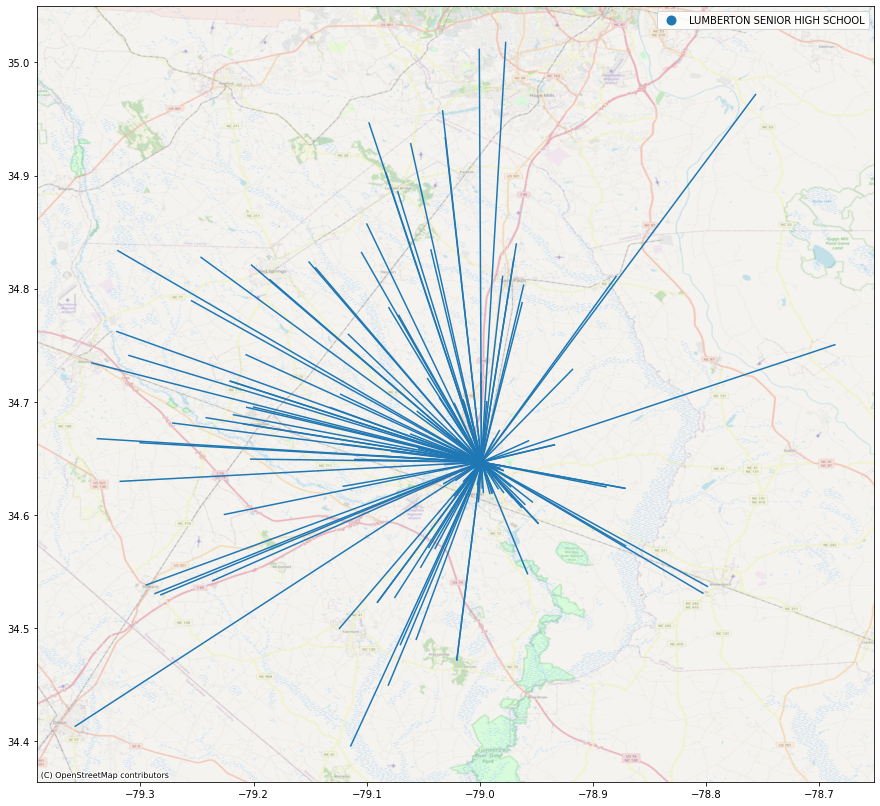

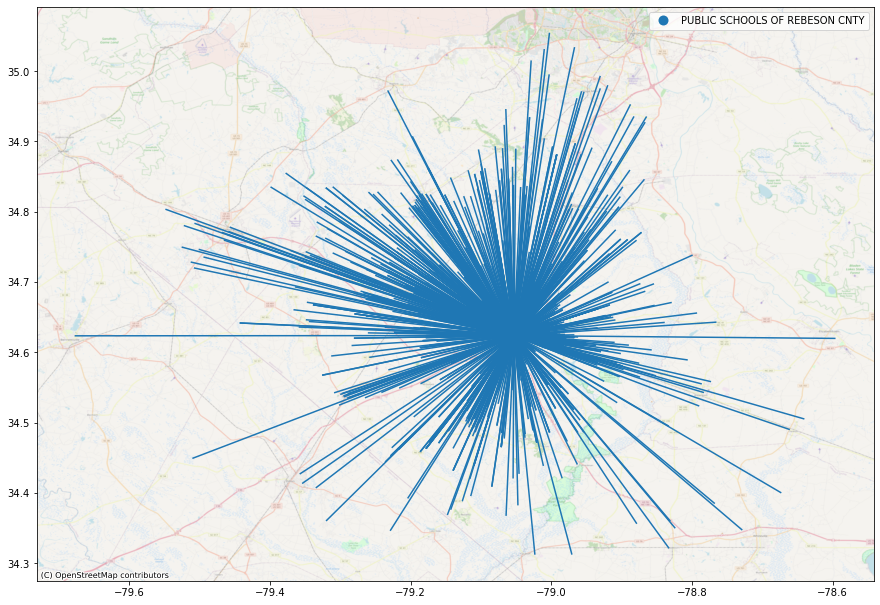

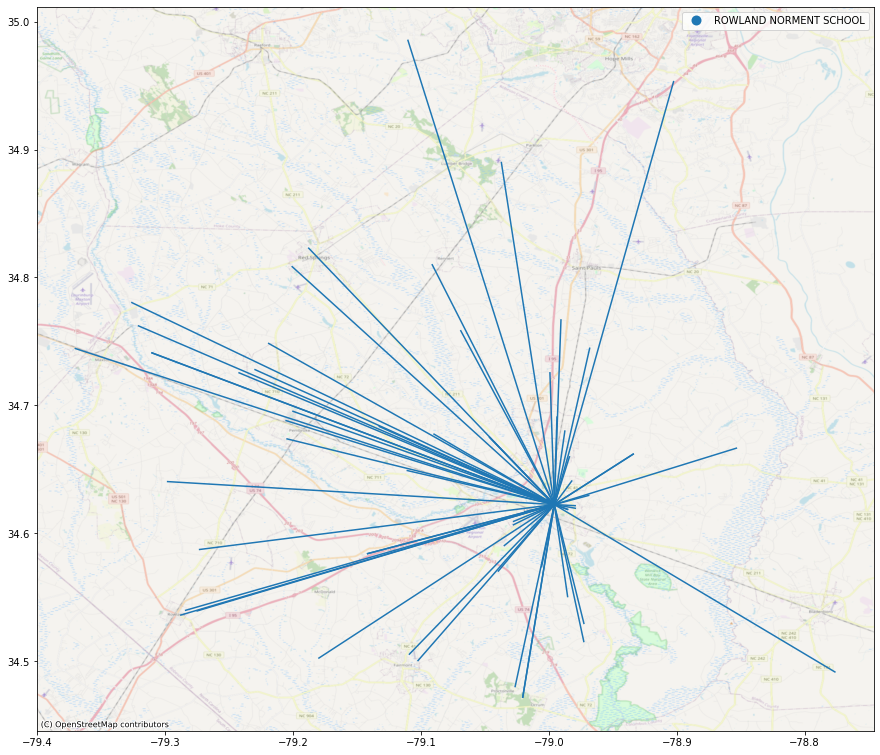

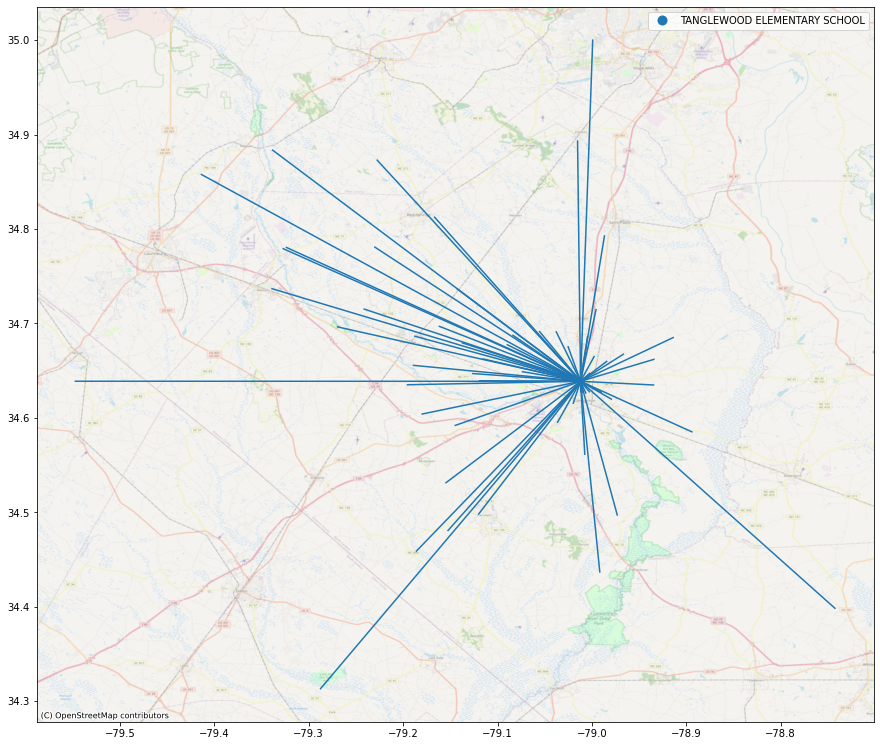

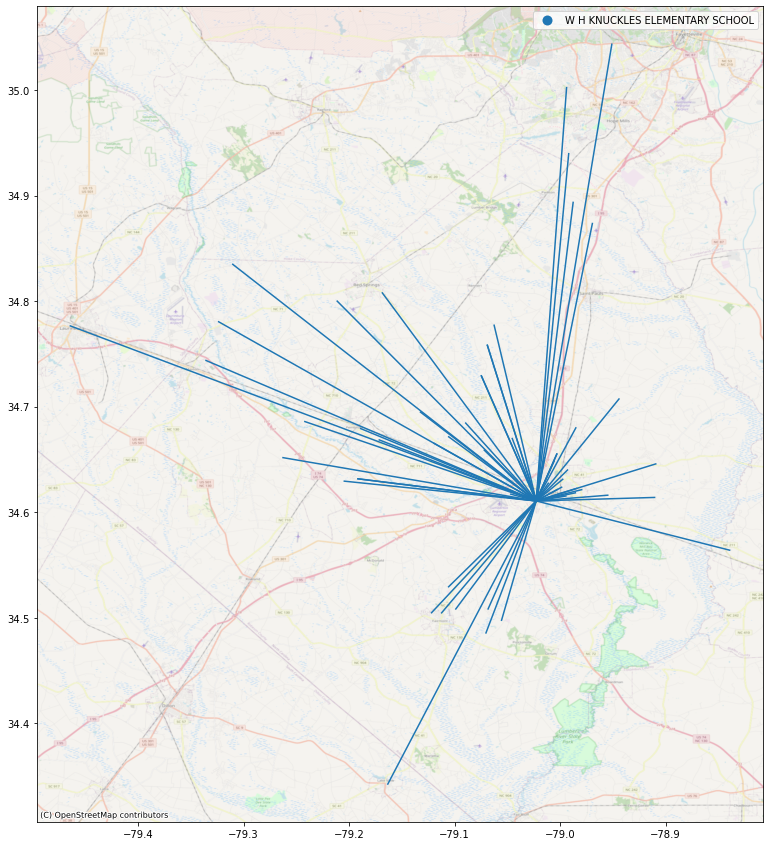

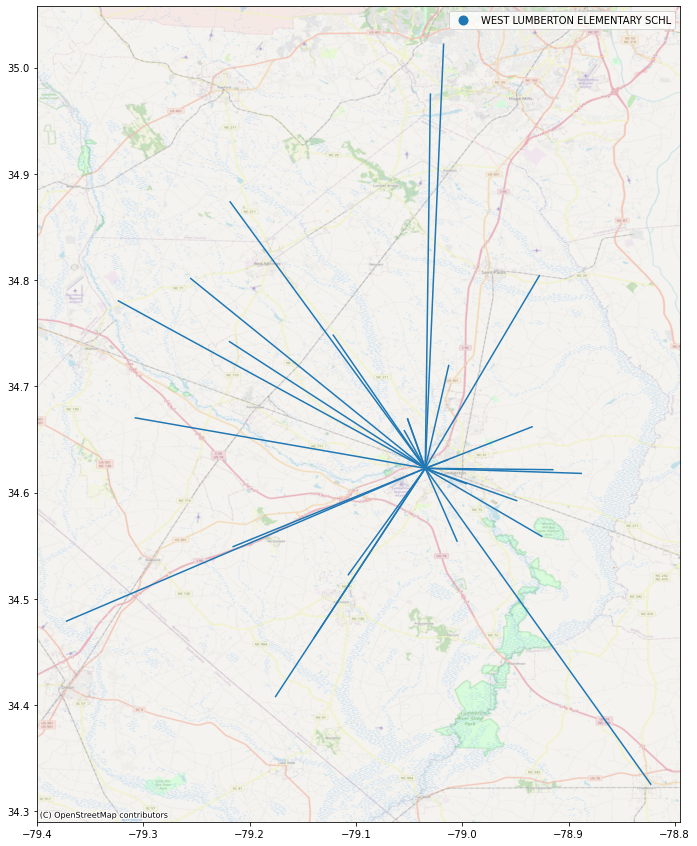

In [42]:
for school_select in selected_staff_schools:
    print(school_select)
    # select school and jobs within 80% of distance
    condition1 = (select_staff_df['od_distance'] < distance_80p)
    condition2 = (select_staff_df['SIName'].isin([school_select]))
    school_staff_map = map_by_linestrings(select_staff_df.loc[condition1 & condition2],
                    linestring_var = 'hcb_wet_line', legend_column = 'SIName', 
                    select_column = 'SIName',
                    obs_select = [school_select])
            
    # save figure
    output_filepath = os.path.join(outputfolders['Explore'], output_filename+school_select+".png")
    school_staff_map.savefig(output_filepath)

### Make Codebook For Data

In [45]:
from pyincore_data_addons.ICD06c_Codebook import *
from pyincore_data_addons.ICD00a_datastructure \
    import prec_v020_DataStructure, staff_v020_DataStructure
datastructure = {**prec_v020_DataStructure, 
                         **staff_v020_DataStructure}

figures_list = []
for school_select in selected_staff_schools:
    filename = output_filename+school_select+".png"
    figures_list.append(filename)

# Create PDF Codebook
pdfcodebook = codebook(input_df = incore_staff_df,
        header_title = 'Person Record File - School Staff Data',
        datastructure = datastructure,
        projectoverview = '',
        keyterms = '',
        communities = communities,
        community = community,
        year = basevintage,
        output_filename = output_filename+'_schoolstaff',
        outputfolders = outputfolders,
        figures = figures_list,
        image_path = 'IN-CORE_HRRC_CodebookBanner.png')

pdfcodebook.create_codebook()

Person Record File - School Staff Data Codebook for Lumberton, NC, 2010
Adding first figure to cover page: prec_v0-2-0_Lumberton_NC_2010_rs9876GILBERT CARROLL MIDDLE SCHOOL.png
ICD_workflow_2022-01-19/RobesonCounty_NC/06_Explore/prec_v0-2-0_Lumberton_NC_2010_rs9876GILBERT CARROLL MIDDLE SCHOOL.png

precid
precid: Person Record ID
huid
huid: Housing Unit ID
Block2010str
Block2010str: 2010 Block ID
hcb_lat
hcb_lat: Home Census Block Latitude
hcb_lon
hcb_lon: Home Census Block Longitude
sex
sex: Sex
5
sex: Sex - Categorical codes, labels and frequencies
race
race: Race
5
race: Race - Categorical codes, labels and frequencies
hispan
hispan: Hispanic
5
hispan: Hispanic - Categorical codes, labels and frequencies
randagePCT12
randagePCT12: Random Age
gqtype
gqtype: Group Quarters Type
4
gqtype: Group Quarters Type - Categorical codes, labels and frequencies
Earnings
Earnings: Earnings Group
5
Earnings: Earnings Group - Categorical codes, labels and frequencies
agegroupLODES
agegroupLODES: Ag

INFO - fpdf.py:_substitute_page_number() - Substitution of '{nb}' was performed in the document


Saving codebook to ICD_workflow_2022-01-19/RobesonCounty_NC/prec_v0-2-0_Lumberton_NC_2010_rs9876_schoolstaff.pdf


In [44]:
from pyincore_data_addons.ICD06c_Codebook import *
from pyincore_data_addons.ICD00a_datastructure \
    import prec_v020_DataStructure, student_v020_DataStructure
datastructure = {**prec_v020_DataStructure, 
                         **student_v020_DataStructure}

figures_list = []
gradelevel_figures_list = ["_PKG04","_G05G06","_G07G08","_G09G12"]
for gradelevel_figure in gradelevel_figures_list:
    filename = output_filename+gradelevel_figure+".png"
    figures_list.append(filename)

# Create PDF Codebook
pdfcodebook = codebook(input_df = incore_student_df,
        header_title = 'Person Record File - Student Data',
        datastructure = datastructure,
        projectoverview = '',
        keyterms = '',
        communities = communities,
        community = community,
        year = basevintage,
        output_filename = output_filename+'_students',
        outputfolders = outputfolders,
        figures = figures_list,
        image_path = 'IN-CORE_HRRC_CodebookBanner.png')

pdfcodebook.create_codebook()

Person Record File - Student Data Codebook for Lumberton, NC, 2010
Adding first figure to cover page: prec_v0-2-0_Lumberton_NC_2010_rs9876_PKG04.png
ICD_workflow_2022-01-19/RobesonCounty_NC/06_Explore/prec_v0-2-0_Lumberton_NC_2010_rs9876_PKG04.png

precid
precid: Person Record ID
huid
huid: Housing Unit ID
Block2010str
Block2010str: 2010 Block ID
hcb_lat
hcb_lat: Home Census Block Latitude
hcb_lon
hcb_lon: Home Census Block Longitude
sex
sex: Sex
5
sex: Sex - Categorical codes, labels and frequencies
race
race: Race
5
race: Race - Categorical codes, labels and frequencies
hispan
hispan: Hispanic
5
hispan: Hispanic - Categorical codes, labels and frequencies
randagePCT12
randagePCT12: Random Age
gqtype
gqtype: Group Quarters Type
4
gqtype: Group Quarters Type - Categorical codes, labels and frequencies
gradelevel
gradelevel: Predicted Grade Level
5
gradelevel: Predicted Grade Level - Categorical codes, labels and frequencies
SCHNAM09
SCHNAM09: School Name
NCESSCH
NCESSCH: NCES School Un

INFO - fpdf.py:_substitute_page_number() - Substitution of '{nb}' was performed in the document


Saving codebook to ICD_workflow_2022-01-19/RobesonCounty_NC/prec_v0-2-0_Lumberton_NC_2010_rs9876_students.pdf
